In [77]:
# %pip install pystac

Note: you may need to restart the kernel to use updated packages.


DEPRECATION: mapbox 0.16.1 has a non-standard dependency specifier python-dateutil>=2.5.0requests. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of mapbox or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063
DEPRECATION: nb-black 1.0.7 has a non-standard dependency specifier black>='19.3'; python_version >= "3.6". pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of nb-black or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [79]:
# imports
from pystac import Catalog, get_stac_version

# import pystac_client
import xarray as xr
import matplotlib.pyplot as plt
import pathlib
import os
import numpy as np
import geopandas as gpd
import matplotlib as mpl
from matplotlib import colors
import rasterio


In [68]:
# opening STAC catalog

root_catalog = pystac_client.Client.open(
    "https://storage.googleapis.com/dgds-data-public/gca/SOTC/gca-stac_sotc/catalog.json" # cloud API
    # r"p:\1000545-054-globalbeaches\15_GlobalCoastalAtlas\coclicodata\current\catalog.json" # P drive API 
)
root_catalog


c:\Users\rowe\AppData\Local\miniconda3\envs\coclico\Lib\site-packages\pystac_client\client.py:186: NoConformsTo: Server does not advertise any conformance classes.
  warnings.warn(NoConformsTo())


<Client id=gca-catalog>

In [69]:
list(root_catalog.get_children())

[<CollectionClient id=shore_mon_fut>,
 <CollectionClient id=sed_class>,
 <CollectionClient id=shore_mon>,
 <CollectionClient id=world_pop>,
 <CollectionClient id=world_gdp>,
 <CollectionClient id=shore_mon_hr>,
 <CollectionClient id=shore_mon_drivers>,
 <CollectionClient id=esl_gwl>,
 <CollectionClient id=sub_threat>,
 <CollectionClient id=Exp_world_pop>,
 <CollectionClient id=Haz-ESL>,
 <CollectionClient id=Vul-Inf_Mort>,
 <CollectionClient id=Haz-GCM_90-100>,
 <CollectionClient id=Exp-NS_Slopes>,
 <CollectionClient id=Vul_MYS>,
 <CollectionClient id=Vul_RS>,
 <CollectionClient id=Haz-GCM_40-50>,
 <CollectionClient id=Haz-ERA5_04-14>,
 <CollectionClient id=Vul-GDP_Cap>,
 <CollectionClient id=Haz-GCM_04-14>,
 <CollectionClient id=Haz-Land_Sub_2010_COGs>,
 <CollectionClient id=Haz-Land_Sub_2040_COGs>,
 <CollectionClient id=Vul-Roads_Density_COGs>]

In [70]:
collection= root_catalog.get_child("Haz-Land_Sub_2010_COGs")
collection

<CollectionClient id=Haz-Land_Sub_2010_COGs>

In [62]:
# b=list(catalog.get_collections())
# for collec in b:
#     print(f"{collec.id}")

In [63]:
items=list(collection.get_all_items())
print(f"Number of items: {len(items)}")


c:\Users\rowe\AppData\Local\miniconda3\envs\coclico\Lib\site-packages\pystac_client\collection_client.py:145: FallbackToPystac: Falling back to pystac. This might be slow.
  root._warn_about_fallback("ITEM_SEARCH")


Number of items: 5520


In [64]:
items

[<Item id=B01_x-102.0_y-1.0>,
 <Item id=B01_x-102.0_y-10.0>,
 <Item id=B01_x-102.0_y-13.0>,
 <Item id=B01_x-102.0_y-16.0>,
 <Item id=B01_x-102.0_y-19.0>,
 <Item id=B01_x-102.0_y-22.0>,
 <Item id=B01_x-102.0_y-25.0>,
 <Item id=B01_x-102.0_y-28.0>,
 <Item id=B01_x-102.0_y-31.0>,
 <Item id=B01_x-102.0_y-34.0>,
 <Item id=B01_x-102.0_y-37.0>,
 <Item id=B01_x-102.0_y-4.0>,
 <Item id=B01_x-102.0_y-40.0>,
 <Item id=B01_x-102.0_y-43.0>,
 <Item id=B01_x-102.0_y-46.0>,
 <Item id=B01_x-102.0_y-49.0>,
 <Item id=B01_x-102.0_y-52.0>,
 <Item id=B01_x-102.0_y-55.0>,
 <Item id=B01_x-102.0_y-7.0>,
 <Item id=B01_x-102.0_y11.0>,
 <Item id=B01_x-102.0_y14.0>,
 <Item id=B01_x-102.0_y17.0>,
 <Item id=B01_x-102.0_y2.0>,
 <Item id=B01_x-102.0_y20.0>,
 <Item id=B01_x-102.0_y23.0>,
 <Item id=B01_x-102.0_y26.0>,
 <Item id=B01_x-102.0_y29.0>,
 <Item id=B01_x-102.0_y32.0>,
 <Item id=B01_x-102.0_y35.0>,
 <Item id=B01_x-102.0_y38.0>,
 <Item id=B01_x-102.0_y41.0>,
 <Item id=B01_x-102.0_y44.0>,
 <Item id=B01_x-102.0_y47

In [65]:

for item in items:
    print(f"- {item.id}")

- B01_x-102.0_y-1.0
- B01_x-102.0_y-10.0
- B01_x-102.0_y-13.0
- B01_x-102.0_y-16.0
- B01_x-102.0_y-19.0
- B01_x-102.0_y-22.0
- B01_x-102.0_y-25.0
- B01_x-102.0_y-28.0
- B01_x-102.0_y-31.0
- B01_x-102.0_y-34.0
- B01_x-102.0_y-37.0
- B01_x-102.0_y-4.0
- B01_x-102.0_y-40.0
- B01_x-102.0_y-43.0
- B01_x-102.0_y-46.0
- B01_x-102.0_y-49.0
- B01_x-102.0_y-52.0
- B01_x-102.0_y-55.0
- B01_x-102.0_y-7.0
- B01_x-102.0_y11.0
- B01_x-102.0_y14.0
- B01_x-102.0_y17.0
- B01_x-102.0_y2.0
- B01_x-102.0_y20.0
- B01_x-102.0_y23.0
- B01_x-102.0_y26.0
- B01_x-102.0_y29.0
- B01_x-102.0_y32.0
- B01_x-102.0_y35.0
- B01_x-102.0_y38.0
- B01_x-102.0_y41.0
- B01_x-102.0_y44.0
- B01_x-102.0_y47.0
- B01_x-102.0_y5.0
- B01_x-102.0_y50.0
- B01_x-102.0_y53.0
- B01_x-102.0_y56.0
- B01_x-102.0_y59.0
- B01_x-102.0_y62.0
- B01_x-102.0_y65.0
- B01_x-102.0_y68.0
- B01_x-102.0_y71.0
- B01_x-102.0_y74.0
- B01_x-102.0_y77.0
- B01_x-102.0_y8.0
- B01_x-102.0_y80.0
- B01_x-105.0_y-1.0
- B01_x-105.0_y-10.0
- B01_x-105.0_y-13.0
- B01

In [71]:
j=items[2].id
j

'B01_x-102.0_y-13.0'

In [76]:
ch=collection.get_item(j,recursive=False)
ch

c:\Users\rowe\AppData\Local\miniconda3\envs\coclico\Lib\site-packages\pystac_client\collection_client.py:193: FallbackToPystac: Falling back to pystac. This might be slow.
  root._warn_about_fallback("FEATURES", "ITEM_SEARCH")
c:\Users\rowe\AppData\Local\miniconda3\envs\coclico\Lib\site-packages\pystac_client\collection_client.py:145: FallbackToPystac: Falling back to pystac. This might be slow.
  root._warn_about_fallback("ITEM_SEARCH")


<Item id=B01_x-102.0_y-1.0>

Test getting B01_x0.0_y5.0.tif

In [36]:
lon=-77.56
lat=+18.28

item_name="B01_x-102.0_y-1.0"
item2=a.get_item(item_name)
item2

c:\Users\rowe\AppData\Local\miniconda3\envs\coclico\Lib\site-packages\pystac_client\collection_client.py:193: FallbackToPystac: Falling back to pystac. This might be slow.
  root._warn_about_fallback("FEATURES", "ITEM_SEARCH")
c:\Users\rowe\AppData\Local\miniconda3\envs\coclico\Lib\site-packages\pystac_client\collection_client.py:145: FallbackToPystac: Falling back to pystac. This might be slow.
  root._warn_about_fallback("ITEM_SEARCH")


<Item id=B01_x-102.0_y-1.0>

In [29]:
item2.bbox

AttributeError: 'generator' object has no attribute 'bbox'

In [ ]:
it=collection.get_child("Haz-Land_Sub_2010_COGs")

In [12]:
href=item.assets["band_data"].href
href

'https://storage.googleapis.com/dgds-data-public/gca/SOTC/Haz-Land_Sub_2010_COGs/B01_x-102.0_y-1.0.tif'

In [10]:
g="https://storage.googleapis.com/dgds-data-public/gca/SOTC/Haz-Land_Sub_2010_COGs/B01_x0.0_y5.0.tif"
i="https://storage.googleapis.com/dgds-data-public/gca/SOTC/Haz-Land_Sub_2010_COGs/B01_x-102.0_y-10.0.tif"

In [8]:
i==g

False

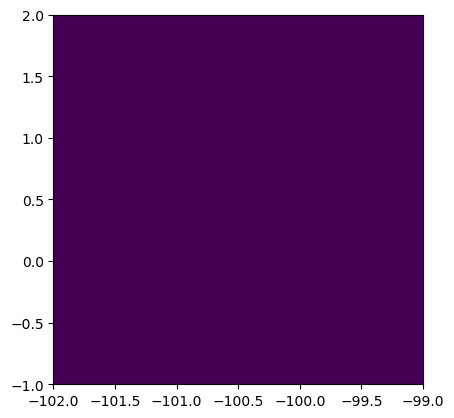

<Axes: >

In [13]:
from rasterio.plot import show

img=rasterio.open(href)
# Plot the entire raster as an RGB image
show(img)

In [51]:
# # COP-DEM goes up in increments of 1 degree

# import math

# lon=-77.56
# lat=+18.28

# if lon>0:
#     sign_lon="E"
# else:
#     sign_lon="W"
# if lat>0:
#     sign_lat="N"
# else:
#     sign_lat="S"
# if abs(lat)<10:
#     newlat="0"+str(math.floor(abs(lat)))
# else:
#     newlat=str(math.floor(abs(lat)))
# if abs(lon)<100:
#     newlon="0"+str(math.floor(abs(lon)))
# else:
#     newlon=str(math.floor(abs(lon)))


# #  eg item_id="ESA_WorldCover_10m_2020_v100_S57W072"
# item_name="urn:eop:VITO:ESA_WorldCover_10m_2020_AWS_V1:ESA_WorldCover_10m_2020_v100_"+ sign_lat+newlat+sign_lon+newlon
# item_name

'urn:eop:VITO:ESA_WorldCover_10m_2020_AWS_V1:ESA_WorldCover_10m_2020_v100_N18W077'

In [55]:
# World cover goes up in increments of 3 degrees

import math

lon=-77.56
lat=+17.28

if lon>0:
    sign_lon="E"
else:
    sign_lon="W"
if lat>0:
    sign_lat="N"
else:
    sign_lat="S"
if abs(lat)<10:
    newlat="0"+str(abs(math.floor(lat/3)*3))
else:
    newlat=str(abs(math.floor(lat/3)*3))
if abs(lon)<100:
    newlon="0"+str(abs(math.floor(lon/3)*3))
else:
    newlon=str(abs(math.floor(lon/3)*3))


#  eg item_id="ESA_WorldCover_10m_2020_v100_S57W072"
item_name="urn:eop:VITO:ESA_WorldCover_10m_2020_AWS_V1:ESA_WorldCover_10m_2020_v100_"+ sign_lat+newlat+sign_lon+newlon
item_name

'urn:eop:VITO:ESA_WorldCover_10m_2020_AWS_V1:ESA_WorldCover_10m_2020_v100_N15W078'

In [56]:

item=a.get_item(item_name)


In [57]:

item.assets

{'ESA_WORLDCOVER_10M_MAP': <Asset href=s3://esa-worldcover/v100/2020/map/ESA_WorldCover_10m_2020_v100_N15W078_Map.tif>}

In [58]:
for asset_key in item.assets:
    asset = item.assets[asset_key]
    print('{}: {} ({})'.format(asset_key, asset.href, asset.media_type))

ESA_WORLDCOVER_10M_MAP: s3://esa-worldcover/v100/2020/map/ESA_WorldCover_10m_2020_v100_N15W078_Map.tif (image/tiff)


In [59]:
href=item.assets["ESA_WORLDCOVER_10M_MAP"].href

In [60]:
# https://github.com/rasterio/rasterio/issues/1637

import rasterio
from rasterio.session import AWSSession

aws_session = rasterio.session.AWSSession(aws_unsigned=True,
                                   region_name='us-west-1')

with rasterio.Env(aws_session):
    # Open the file in read mode
    with rasterio.open(href) as src:
        # Read the first band as a numpy array
        band1 = src.read(1)
        # Access metadata about the dataset
        print(src.meta)

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': 0.0, 'width': 36000, 'height': 36000, 'count': 1, 'crs': CRS.from_epsg(4326), 'transform': Affine(8.333333333333333e-05, 0.0, -78.0,
       0.0, -8.333333333333333e-05, 18.0)}


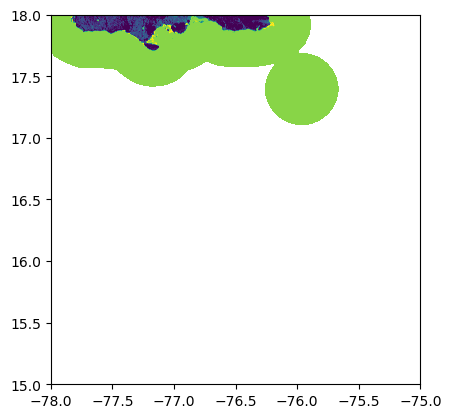

In [61]:
from rasterio.plot import show

with rasterio.Env(aws_session):
    img=rasterio.open(href)
    # Plot the entire raster as an RGB image
    show(img)